<a href="https://colab.research.google.com/github/daniui/Machine-Learning-Project/blob/main/Digital%20Image%20Preprocessing%20/Intensity%20Transformations%20and%20Spatial%20Filtering/%20TK_1_Citra_Digital_Kelompok_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Kelompok 2 (Intensity Transformations and Spatial Filtering):
- Hilmy Rahmadani (2206810490)
- Cecil
- Fakhri
- Abisena

In [34]:
img_path_1 = '/content/do_nawab-100x100.png'
img_path_2 = '/content/Screenshot 2025-02-28 at 22.24.14.png'
img_path_3 = '/content/Screenshot 2025-02-28 at 23.32.22.png'
xray_img = '/content/xray.jpeg'

#Some Basic Intensity Transformation Function

# Histogram Equalization

In [33]:
# import Opencv
import cv2

# import Numpy
import numpy as np

# read a image using imread
img = cv2.imread('/content/do_nawab-100x100.png', cv2.IMREAD_GRAYSCALE)
img

<ipython-input-4-8e5a56d5d93d>:9: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.flatten(),256,[0,256], color = 'r')


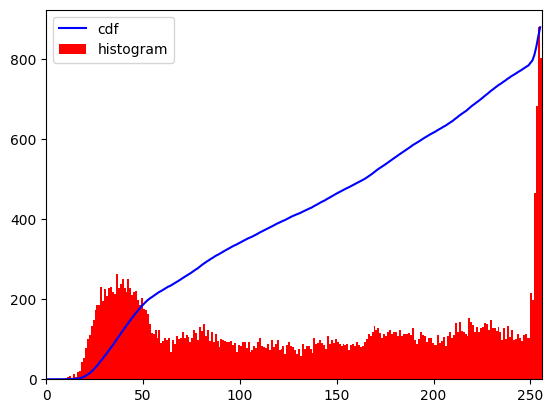

In [4]:
import matplotlib.pyplot as plt

hist,bins = np.histogram(img.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()


<ipython-input-7-8e5a56d5d93d>:9: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.flatten(),256,[0,256], color = 'r')


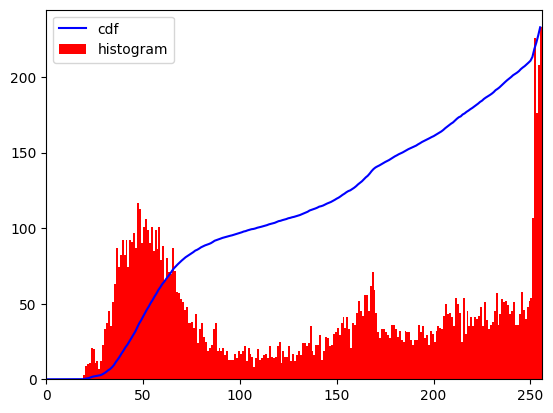

In [7]:
import matplotlib.pyplot as plt

hist,bins = np.histogram(img.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()


In [10]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
cdf

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   1,   2,
         2,   2,   2,   3,   4,   5,   6,   7,   8,  10,  12,  14,  16,
        18,  20,  23,  25,  27,  29,  32,  34,  37,  40,  42,  45,  47,
        50,  52,  55,  57,  59,  62,  64,  66,  68,  70,  72,  74,  76,
        78,  80,  81,  83,  84,  85,  87,  88,  89,  90,  91,  92,  93,
        93,  94,  95,  96,  96,  97,  97,  98,  99, 100, 100, 101, 101,
       102, 102, 103, 103, 103, 104, 104, 105, 105, 105, 106, 107, 107,
       107, 108, 108, 108, 109, 109, 110, 110, 110, 111, 111, 112, 112,
       112, 113, 113, 114, 114, 115, 115, 116, 116, 116, 117, 117, 118,
       118, 118, 119, 120, 120, 121, 122, 122, 123, 123, 124, 125, 125,
       125, 126, 127, 127, 128, 129, 129, 130, 131, 132, 133, 134, 135,
       136, 136, 137, 138, 139, 141, 142, 143, 144, 146, 147, 148, 150,
       152, 153, 154, 154, 155, 156, 157, 158, 158, 159, 160, 16

array([[104, 105, 107, ...,   4,   4,   2],
       [105, 105, 103, ...,   5,  14,   7],
       [107,  98,  93, ...,   8,   5,   3],
       ...,
       [  0,   0,   0, ...,  12,   4,   5],
       [  1,   1,   1, ...,   7,   3,   4],
       [  2,   1,   1, ...,  14,   6,  10]], dtype=uint8)
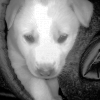

In [11]:
img2 = cdf[img]
img2

<ipython-input-12-49136888b0e3>:7: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img2.flatten(),256,[0,256], color = 'r')


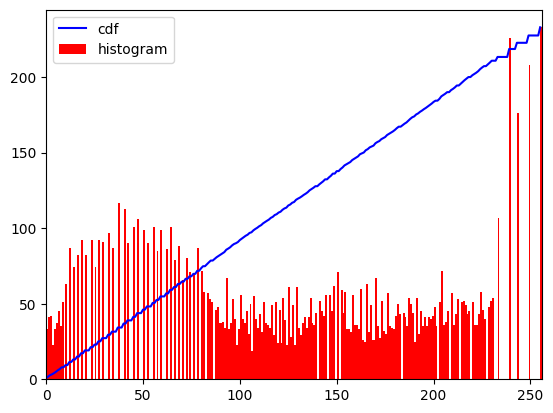

In [12]:
hist,bins = np.histogram(img2.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

array([[104, 106, 108, ...,   4,   4,   3],
       [106, 106, 104, ...,   5,  14,   7],
       [107,  99,  93, ...,   9,   5,   3],
       ...,
       [  0,   0,   0, ...,  12,   4,   5],
       [  2,   1,   2, ...,   7,   3,   4],
       [  2,   2,   2, ...,  14,   6,  10]], dtype=uint8)
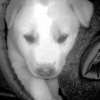

In [8]:
equ = cv2.equalizeHist(img)
equ

array([[ 96,  99, 104, ...,   4,   4,   3],
       [ 99,  99,  94, ...,   5,  14,   7],
       [102,  85,  77, ...,   9,   5,   3],
       ...,
       [ 20,  21,  20, ...,  12,   4,   5],
       [ 24,  23,  24, ...,   7,   3,   4],
       [ 25,  24,  24, ...,  14,   6,  10]], dtype=uint8)
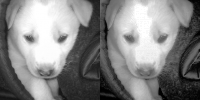

In [9]:
res = np.hstack((img, equ))
res

<ipython-input-13-6a3a71326240>:7: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(equ.flatten(),256,[0,256], color = 'r')


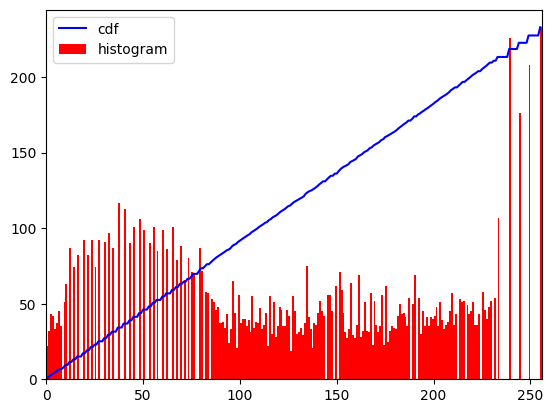

In [13]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

#Histogram Matching

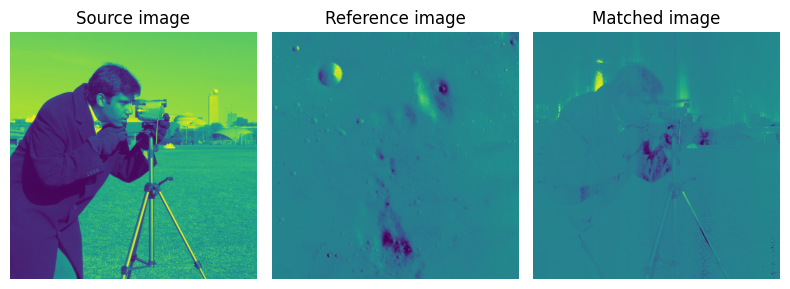

In [21]:
# importing packages
import matplotlib.pyplot as plt
from skimage import data
from skimage import exposure
from skimage.exposure import match_histograms

# loading data
reference = data.moon()
image = data.camera()

# matching histograms
matched = match_histograms(image, reference,
						channel_axis=1)

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1,
									ncols=3,
									figsize=(8, 3),
									sharex=True,
									sharey=True)
for aa in (ax1, ax2, ax3):
	aa.set_axis_off()

# displaying images
ax1.imshow(image)
ax1.set_title('Source image')
ax2.imshow(reference)
ax2.set_title('Reference image')
ax3.imshow(matched)
ax3.set_title('Matched image')

plt.tight_layout()
plt.show()


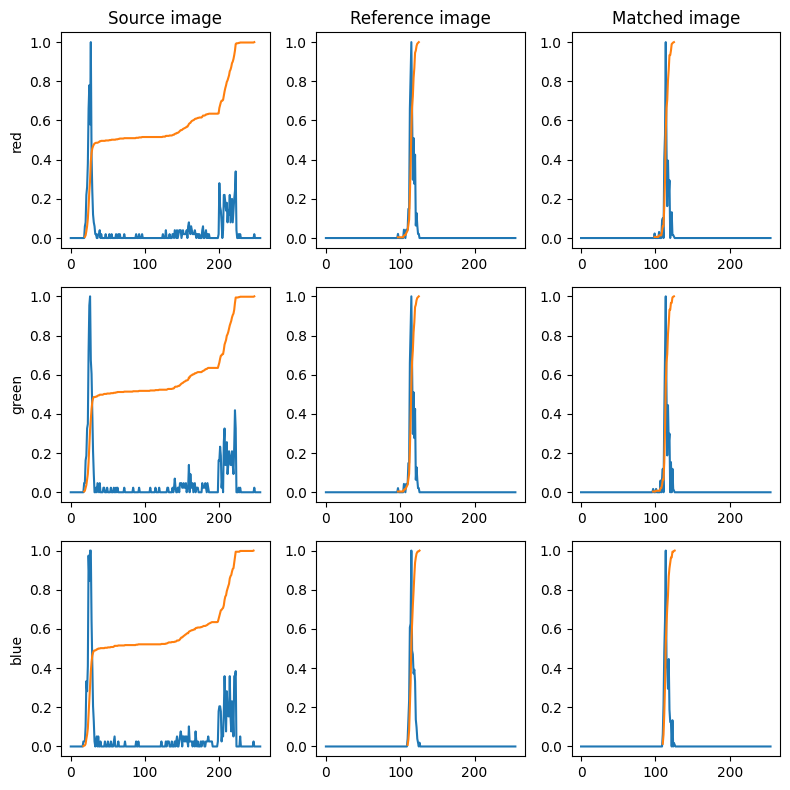

In [22]:
# displaying histograms.
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))

for i, img in enumerate((image, reference, matched)):
	for c, c_color in enumerate(('red', 'green', 'blue')):
		img_hist, bins = exposure.histogram(img[..., c],
											source_range='dtype')
		axes[c, i].plot(bins, img_hist / img_hist.max())
		img_cdf, bins = exposure.cumulative_distribution(img[..., c])
		axes[c, i].plot(bins, img_cdf)
		axes[c, 0].set_ylabel(c_color)

axes[0, 0].set_title('Source image')
axes[0, 1].set_title('Reference image')
axes[0, 2].set_title('Matched image')

plt.tight_layout()
plt.show()


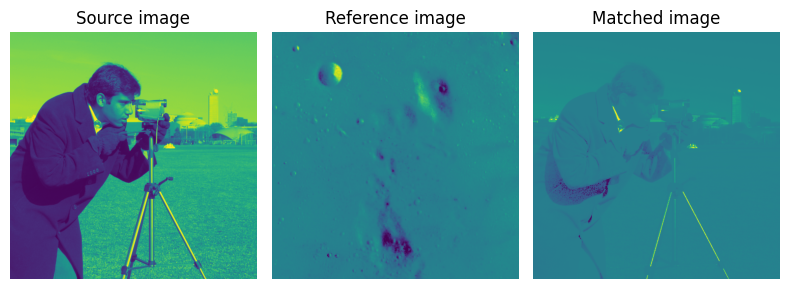

In [23]:
# importing packages
import matplotlib.pyplot as plt
from skimage import data
from skimage import exposure
from skimage.exposure import match_histograms

# loading data
reference = data.moon()
image = data.camera()

# matching histograms
matched = match_histograms(image, reference)

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1,
									ncols=3,
									figsize=(8, 3),
									sharex=True,
									sharey=True)
for aa in (ax1, ax2, ax3):
	aa.set_axis_off()

# displaying images
ax1.imshow(image)
ax1.set_title('Source image')
ax2.imshow(reference)
ax2.set_title('Reference image')
ax3.imshow(matched)
ax3.set_title('Matched image')

plt.tight_layout()
plt.show()


<ipython-input-24-dea4b4120c77>:8: RuntimeWarning: invalid value encountered in divide
  axes[c, i].plot(bins, img_hist / img_hist.max())


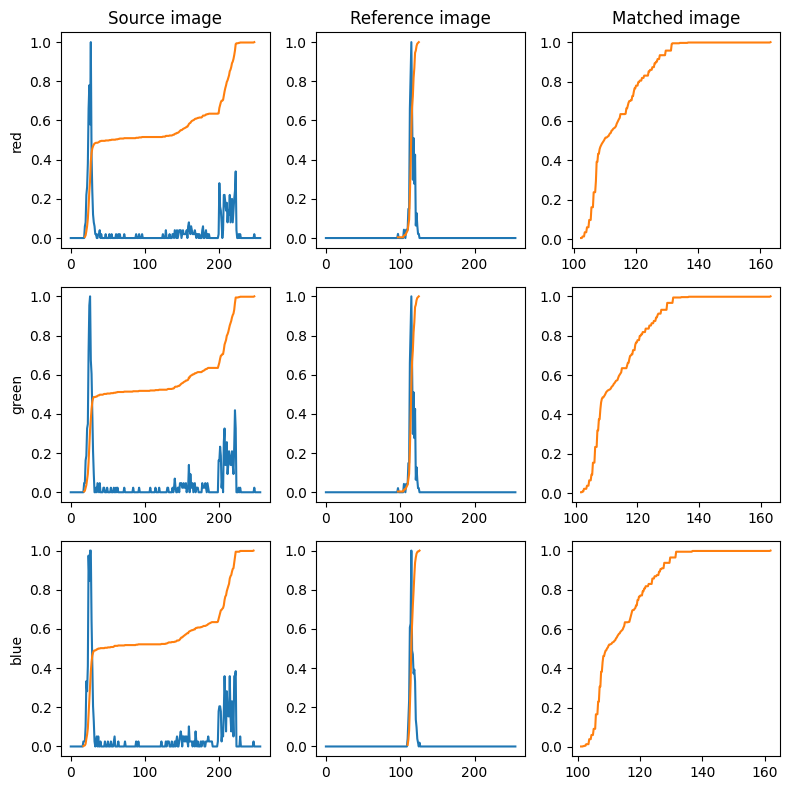

In [24]:
# displaying histograms.
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))

for i, img in enumerate((image, reference, matched)):
	for c, c_color in enumerate(('red', 'green', 'blue')):
		img_hist, bins = exposure.histogram(img[..., c],
											source_range='dtype')
		axes[c, i].plot(bins, img_hist / img_hist.max())
		img_cdf, bins = exposure.cumulative_distribution(img[..., c])
		axes[c, i].plot(bins, img_cdf)
		axes[c, 0].set_ylabel(c_color)

axes[0, 0].set_title('Source image')
axes[0, 1].set_title('Reference image')
axes[0, 2].set_title('Matched image')

plt.tight_layout()
plt.show()


#Spatial Correlation and Convolution

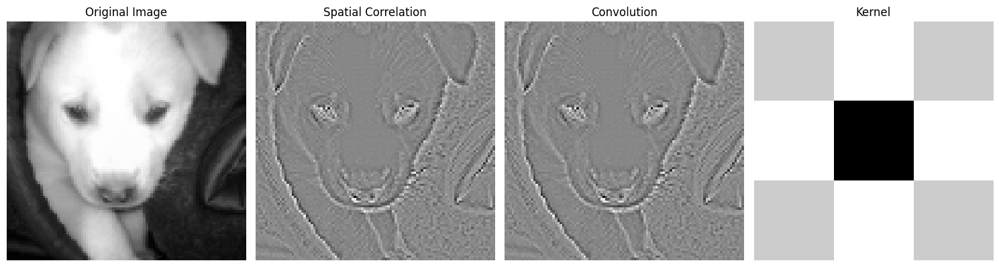

In [27]:
import numpy as np
from scipy import datasets
import cv2
import matplotlib.pyplot as plt
from scipy.signal import correlate2d, convolve2d

# Load an image
image = cv2.imread('/content/do_nawab-100x100.png', cv2.IMREAD_GRAYSCALE)

# Define a simple kernel (filter) for demonstration
kernel = np.array([[0, 1, 0],
                   [1, -4, 1],
                   [0, 1, 0]])

# ---------------------------------
# Spatial Correlation (using scipy correlate2d)
# ---------------------------------
correlated_image = correlate2d(image, kernel, mode='same', boundary='symm')

# ---------------------------------
# Convolution (using scipy convolve2d)
# ---------------------------------
# Convolution involves flipping the kernel before applying
flipped_kernel = np.flipud(np.fliplr(kernel))  # Flip kernel both vertically and horizontally
convolved_image = convolve2d(image, flipped_kernel, mode='same', boundary='symm')

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(correlated_image, cmap='gray')
axes[1].set_title('Spatial Correlation')
axes[1].axis('off')

axes[2].imshow(convolved_image, cmap='gray')
axes[2].set_title('Convolution')
axes[2].axis('off')

# Optional: Show kernel for visualization
axes[3].imshow(kernel, cmap='gray')
axes[3].set_title('Kernel')
axes[3].axis('off')

plt.tight_layout()
plt.show()


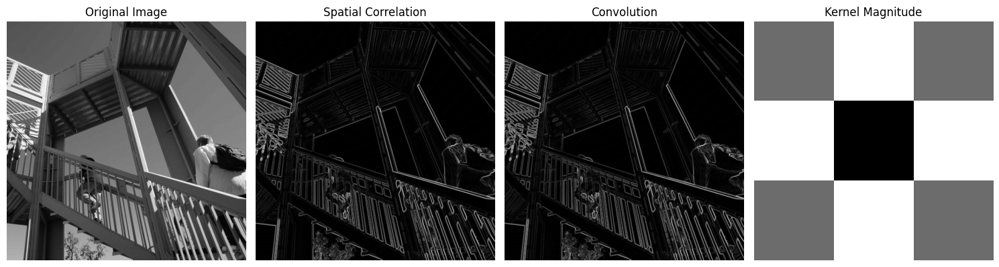

In [33]:
image = datasets.ascent()

# Define the complex kernel you provided
kernel = np.array([[ -3-3j, 0-10j,  +3-3j],
                   [-10+0j, 0+0j, +10+0j],
                   [ -3+3j, 0+10j,  +3+3j]])

# ---------------------------------
# Spatial Correlation (using scipy correlate2d)
# ---------------------------------
correlated_image = correlate2d(image, kernel, mode='same', boundary='symm')

# ---------------------------------
# Convolution (using scipy convolve2d)
# ---------------------------------
# Convolution involves flipping the kernel before applying
flipped_kernel = np.flipud(np.fliplr(kernel))  # Flip kernel both vertically and horizontally
convolved_image = convolve2d(image, flipped_kernel, mode='same', boundary='symm')

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
# Show the original image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Show the spatial correlation (real part)
axes[1].imshow(np.abs(correlated_image), cmap='gray')  # Show magnitude of the result
axes[1].set_title('Spatial Correlation')
axes[1].axis('off')

# Show the convolution (real part)
axes[2].imshow(np.abs(convolved_image), cmap='gray')  # Show magnitude of the result
axes[2].set_title('Convolution')
axes[2].axis('off')

# Optional: Show the complex kernel (real part or magnitude)
axes[3].imshow(np.abs(kernel), cmap='gray')  # Show magnitude of the kernel
axes[3].set_title('Kernel Magnitude')
axes[3].axis('off')

plt.tight_layout()
plt.show()

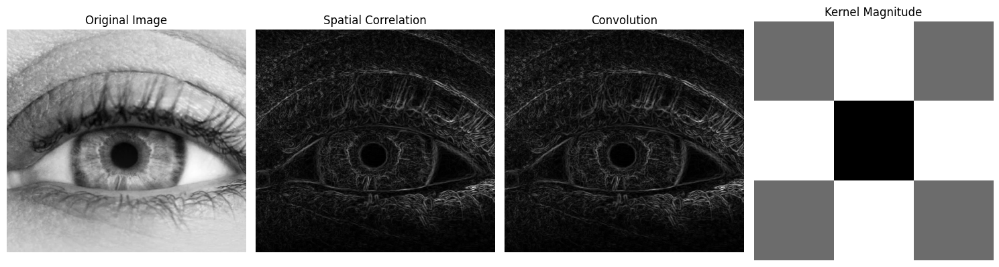

In [35]:
image = cv2.imread('/content/Screenshot 2025-02-28 at 22.24.14.png', cv2.IMREAD_GRAYSCALE)

# Define the complex kernel you provided
kernel = np.array([[ -3-3j, 0-10j,  +3-3j],
                   [-10+0j, 0+0j, +10+0j],
                   [ -3+3j, 0+10j,  +3+3j]])

# ---------------------------------
# Spatial Correlation (using scipy correlate2d)
# ---------------------------------
correlated_image = correlate2d(image, kernel, mode='same', boundary='symm')

# ---------------------------------
# Convolution (using scipy convolve2d)
# ---------------------------------
# Convolution involves flipping the kernel before applying
flipped_kernel = np.flipud(np.fliplr(kernel))  # Flip kernel both vertically and horizontally
convolved_image = convolve2d(image, flipped_kernel, mode='same', boundary='symm')

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
# Show the original image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Show the spatial correlation (real part)
axes[1].imshow(np.abs(correlated_image), cmap='gray')  # Show magnitude of the result
axes[1].set_title('Spatial Correlation')
axes[1].axis('off')

# Show the convolution (real part)
axes[2].imshow(np.abs(convolved_image), cmap='gray')  # Show magnitude of the result
axes[2].set_title('Convolution')
axes[2].axis('off')

# Optional: Show the complex kernel (real part or magnitude)
axes[3].imshow(np.abs(kernel), cmap='gray')  # Show magnitude of the kernel
axes[3].set_title('Kernel Magnitude')
axes[3].axis('off')

plt.tight_layout()
plt.show()

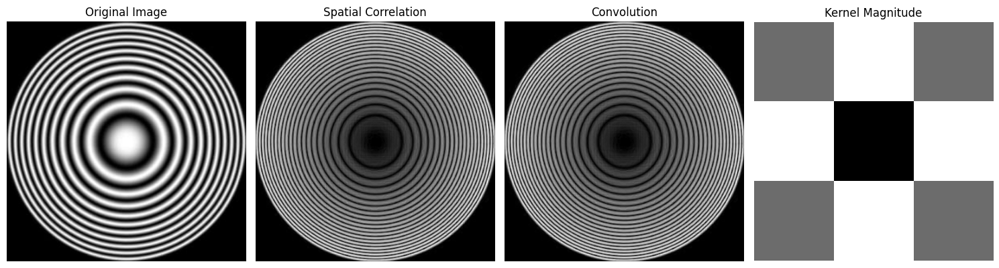

In [67]:
image = cv2.imread(img_path_3, cv2.IMREAD_GRAYSCALE)

# Define the complex kernel you provided
kernel = np.array([[ -3-3j, 0-10j,  +3-3j],
                   [-10+0j, 0+0j, +10+0j],
                   [ -3+3j, 0+10j,  +3+3j]])

# ---------------------------------
# Spatial Correlation (using scipy correlate2d)
# ---------------------------------
correlated_image = correlate2d(image, kernel, mode='same', boundary='symm')

# ---------------------------------
# Convolution (using scipy convolve2d)
# ---------------------------------
# Convolution involves flipping the kernel before applying
flipped_kernel = np.flipud(np.fliplr(kernel))  # Flip kernel both vertically and horizontally
convolved_image = convolve2d(image, flipped_kernel, mode='same', boundary='symm')

# Plot the results
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
# Show the original image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Show the spatial correlation (real part)
axes[1].imshow(np.abs(correlated_image), cmap='gray')  # Show magnitude of the result
axes[1].set_title('Spatial Correlation')
axes[1].axis('off')

# Show the convolution (real part)
axes[2].imshow(np.abs(convolved_image), cmap='gray')  # Show magnitude of the result
axes[2].set_title('Convolution')
axes[2].axis('off')

# Optional: Show the complex kernel (real part or magnitude)
axes[3].imshow(np.abs(kernel), cmap='gray')  # Show magnitude of the kernel
axes[3].set_title('Kernel Magnitude')
axes[3].axis('off')

plt.tight_layout()
plt.show()

#Smoothing (Low-Pass) Filter


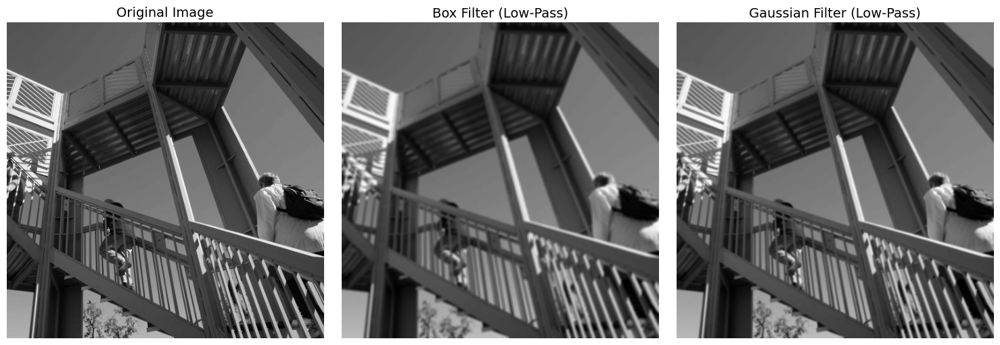

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
from scipy.signal import convolve2d

# Convert the image to grayscale if it's not
image_gray = datasets.ascent()

# Define a Box filter (also known as a uniform filter)
def box_filter(size: int):
    """Generate a Box (mean) filter of a given size."""
    return np.ones((size, size)) / (size * size)

# Define a Gaussian filter (low-pass filter)
def gaussian_kernel(size: int, sigma: float):
    """Generate a Gaussian kernel of a given size and standard deviation."""
    kernel = np.fromfunction(
        lambda x, y: (1 / (2 * np.pi * sigma**2)) * np.exp(
            - ((x - (size - 1) / 2)**2 + (y - (size - 1) / 2)**2) / (2 * sigma**2)
        ),
        (size, size)
    )
    return kernel / np.sum(kernel)  # Normalize to ensure the sum of the kernel is 1

# Generate a Box filter (size 5x5)
box_filter_kernel = box_filter(5)

# Generate a Gaussian kernel (size 5x5 with sigma=1)
gaussian_filter = gaussian_kernel(5, 1)

# Perform spatial filtering using the Box filter
box_filtered_image = convolve2d(image_gray, box_filter_kernel, mode='same', boundary='symm')

# Perform spatial filtering using the Gaussian filter
gaussian_filtered_image = convolve2d(image_gray, gaussian_filter, mode='same', boundary='symm')

# Create a figure with subplots to display the images side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Show the original image
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

# Show the Box filter image
axes[1].imshow(box_filtered_image, cmap='gray')
axes[1].set_title('Box Filter (Low-Pass)', fontsize=14)
axes[1].axis('off')

# Show the Mean filtered image (same as Box filter)
axes[2].imshow(gaussian_filtered_image, cmap='gray')
axes[2].set_title('Gaussian Filter (Low-Pass)', fontsize=14)
axes[2].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


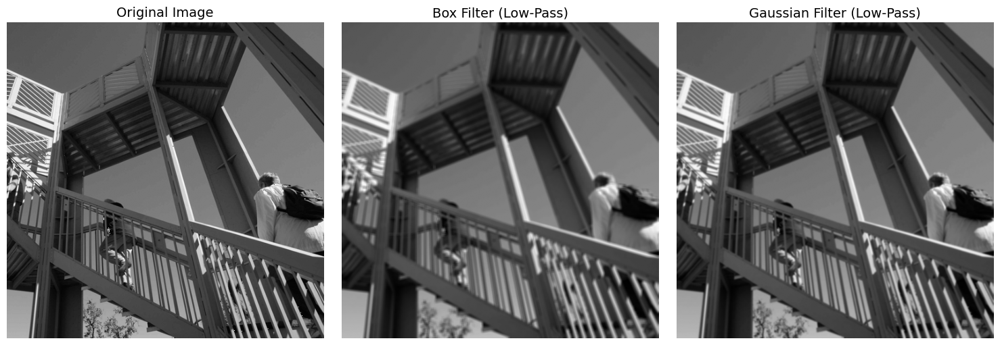

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data, color
# Convert the image to grayscale if it's not
image_gray = datasets.ascent()

# Define the Box filter kernel (5x5 mean filter)
kernel = np.ones((5, 5), np.float32) / 25  # 5x5 Box filter (mean filter)

# Perform the Box filter using cv2.filter2D
box_filtered_image = cv2.filter2D(image_gray, -1, kernel)

# Perform Gaussian smoothing using cv2.GaussianBlur (size=5, sigmaX=1)
gaussian_filtered_image = cv2.GaussianBlur(image_gray, (5, 5), 1)

# Create a figure with subplots to display the images side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Show the original image
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

# Show the Box filter image
axes[1].imshow(box_filtered_image, cmap='gray')
axes[1].set_title('Box Filter (Low-Pass)', fontsize=14)
axes[1].axis('off')

# Show the Gaussian filtered image using OpenCV
axes[2].imshow(gaussian_filtered_image, cmap='gray')
axes[2].set_title('Gaussian Filter (Low-Pass)', fontsize=14)
axes[2].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


#Sharpening (High-Pass) Filter

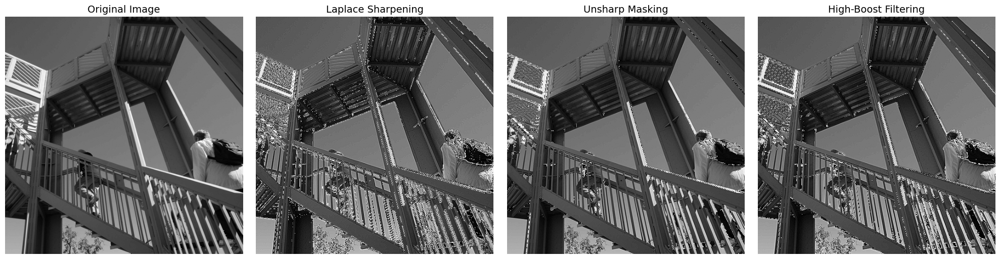

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data, color
from scipy.ndimage import convolve

image_gray = datasets.ascent()

# 1. **Laplace for Sharpening** (Laplacian filter)
laplacian_kernel = np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])

# Apply the Laplacian filter using convolution
laplacian_filtered = convolve(image_gray, laplacian_kernel)

# Sharpen the image by subtracting the Laplacian filtered image from the original
laplacian_sharpened = image_gray - laplacian_filtered

# 2. **Unsharp Masking**
# Apply Gaussian blur to the image (using OpenCV)
gaussian_blurred = cv2.GaussianBlur(image_gray, (5, 5), 1)

# Subtract the blurred image from the original to get the unsharp mask
unsharp_mask = image_gray - gaussian_blurred

# Add the unsharp mask back to the original image
unsharp_sharpened = image_gray + unsharp_mask

# 3. **High-Boost Filtering**
# High-Boost Filtering is essentially unsharp masking with a boost factor
boost_factor = 2  # Boost factor (greater than 1)
high_boost_sharpened = image_gray + boost_factor * unsharp_mask

# Create a figure with subplots to display the images side by side
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Show the original image
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

# Show the Laplace sharpened image
axes[1].imshow(laplacian_sharpened, cmap='gray')
axes[1].set_title('Laplace Sharpening', fontsize=14)
axes[1].axis('off')

# Show the Unsharp Masking sharpened image
axes[2].imshow(unsharp_sharpened, cmap='gray')
axes[2].set_title('Unsharp Masking', fontsize=14)
axes[2].axis('off')

# Show the High-Boost Filtering sharpened image
axes[3].imshow(high_boost_sharpened, cmap='gray')
axes[3].set_title('High-Boost Filtering', fontsize=14)
axes[3].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


#Highpass, Bandreject, and Bandpass Filters from Low-Pass Filters

In [63]:
img_path_3

'/content/Screenshot 2025-02-28 at 23.32.22.png'

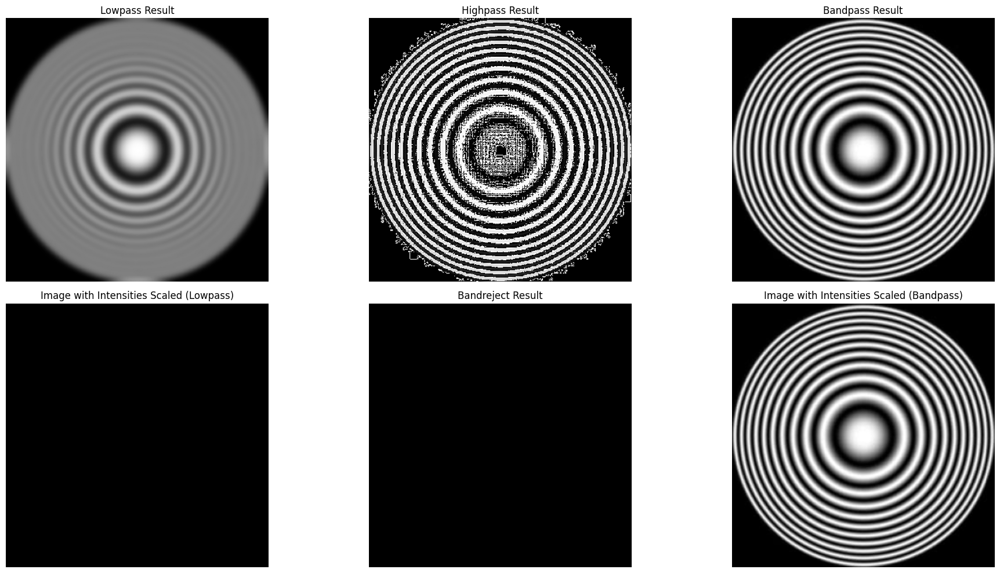

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
import cv2
from scipy.ndimage import convolve
from scipy import fftpack

image_gray = cv2.imread(img_path_3, cv2.IMREAD_GRAYSCALE)

# 1. Low-pass filtering using a Gaussian filter (blurring)
lowpass_image = cv2.GaussianBlur(image_gray, (21, 21), 5)

# 2. High-pass filtering using a Laplacian filter (edge detection)
laplacian_kernel = np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])

highpass_image = convolve(image_gray, laplacian_kernel)

# 3. Bandpass filtering (using the Fourier Transform method)
# Apply a low-pass filter (Gaussian) and a high-pass filter (Laplacian) in frequency domain
f = fftpack.fft2(image_gray)
fshift = fftpack.fftshift(f)  # Shift the zero frequency component to the center

# Low-pass filter in the frequency domain (Gaussian)
rows, cols = image_gray.shape
crow, ccol = rows // 2, cols // 2
radius = 30
mask = np.ones((rows, cols), dtype=np.float32)

# Create a meshgrid for distance calculation
x = np.fft.fftfreq(cols)
y = np.fft.fftfreq(rows)

# Ensure that the distance grid has the correct shape (matching image shape)
xv, yv = np.meshgrid(x, y)
distance = np.sqrt((xv - 0)**2 + (yv - 0)**2)

mask[distance < radius] = 0  # Low pass filter: block the low frequency parts

# Apply the mask to the Fourier transformed image
fshift_lowpass = fshift * mask
image_lowpass_freq = np.abs(fftpack.ifft2(np.fft.ifftshift(fshift_lowpass)))

# High-pass filtering by subtracting low-pass from original
bandpass_image = image_gray - image_lowpass_freq

# 4. Bandreject filtering (using a complementary mask to block certain frequencies)
bandreject_image = image_gray - bandpass_image

# 5. Intensities scaling for better visualization
bandpass_image_scaled = cv2.normalize(bandpass_image, None, 0, 255, cv2.NORM_MINMAX)
bandreject_image_scaled = cv2.normalize(bandreject_image, None, 0, 255, cv2.NORM_MINMAX)

# Create the figure with subplots to display the images
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Display each result as in the figure you provided
axes[0, 0].imshow(lowpass_image, cmap='gray')
axes[0, 0].set_title('Lowpass Result')
axes[0, 0].axis('off')

axes[0, 1].imshow(highpass_image, cmap='gray')
axes[0, 1].set_title('Highpass Result')
axes[0, 1].axis('off')

axes[0, 2].imshow(bandpass_image, cmap='gray')
axes[0, 2].set_title('Bandpass Result')
axes[0, 2].axis('off')

axes[1, 0].imshow(image_lowpass_freq, cmap='gray')
axes[1, 0].set_title('Image with Intensities Scaled (Lowpass)')
axes[1, 0].axis('off')

axes[1, 1].imshow(bandreject_image_scaled, cmap='gray')
axes[1, 1].set_title('Bandreject Result')
axes[1, 1].axis('off')

axes[1, 2].imshow(bandpass_image_scaled, cmap='gray')
axes[1, 2].set_title('Image with Intensities Scaled (Bandpass)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


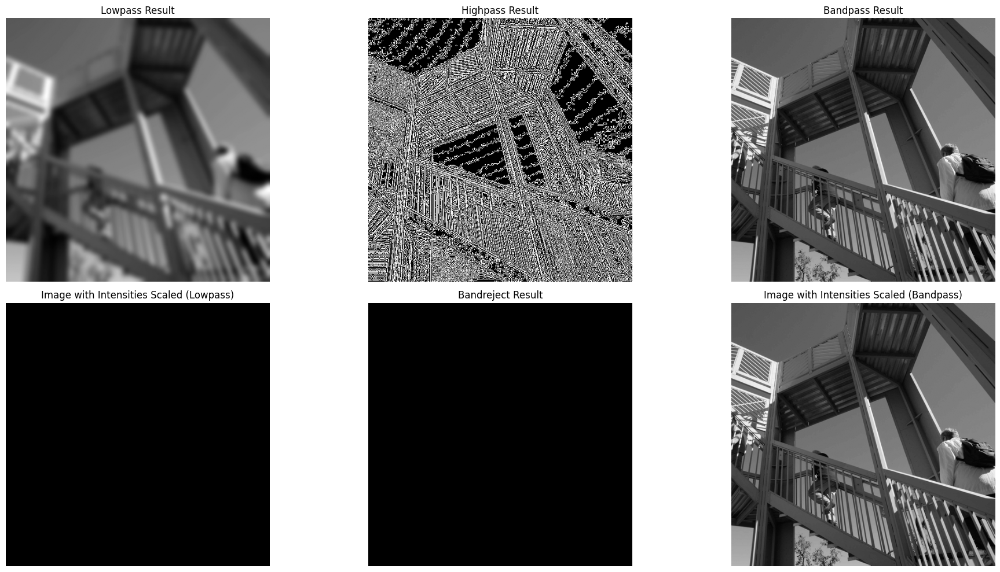

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
import cv2
from scipy.ndimage import convolve
from scipy import fftpack

image_gray = datasets.ascent()

# 1. Low-pass filtering using a Gaussian filter (blurring)
lowpass_image = cv2.GaussianBlur(image_gray, (21, 21), 5)

# 2. High-pass filtering using a Laplacian filter (edge detection)
laplacian_kernel = np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])

highpass_image = convolve(image_gray, laplacian_kernel)

# 3. Bandpass filtering (using the Fourier Transform method)
# Apply a low-pass filter (Gaussian) and a high-pass filter (Laplacian) in frequency domain
f = fftpack.fft2(image_gray)
fshift = fftpack.fftshift(f)  # Shift the zero frequency component to the center

# Low-pass filter in the frequency domain (Gaussian)
rows, cols = image_gray.shape
crow, ccol = rows // 2, cols // 2
radius = 30
mask = np.ones((rows, cols), dtype=np.float32)
center = [crow, ccol]
x, y = np.fft.fftfreq(cols), np.fft.fftfreq(rows)
distance = np.sqrt((x[:, None] - x[None, :])**2 + (y[:, None] - y[None, :])**2)
mask[distance < radius] = 0  # Low pass filter: block the low frequency parts

# Apply the mask to the Fourier transformed image
fshift_lowpass = fshift * mask
image_lowpass_freq = np.abs(fftpack.ifft2(np.fft.ifftshift(fshift_lowpass)))

# High-pass filtering by subtracting low-pass from original
bandpass_image = image_gray - image_lowpass_freq

# 4. Bandreject filtering (using a complementary mask to block certain frequencies)
bandreject_image = image_gray - bandpass_image

# 5. Intensities scaling for better visualization
bandpass_image_scaled = cv2.normalize(bandpass_image, None, 0, 255, cv2.NORM_MINMAX)
bandreject_image_scaled = cv2.normalize(bandreject_image, None, 0, 255, cv2.NORM_MINMAX)

# Create the figure with subplots to display the images
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Display each result as in the figure you provided
axes[0, 0].imshow(lowpass_image, cmap='gray')
axes[0, 0].set_title('Lowpass Result')
axes[0, 0].axis('off')

axes[0, 1].imshow(highpass_image, cmap='gray')
axes[0, 1].set_title('Highpass Result')
axes[0, 1].axis('off')

axes[0, 2].imshow(bandpass_image, cmap='gray')
axes[0, 2].set_title('Bandpass Result')
axes[0, 2].axis('off')

axes[1, 0].imshow(image_lowpass_freq, cmap='gray')
axes[1, 0].set_title('Image with Intensities Scaled (Lowpass)')
axes[1, 0].axis('off')

axes[1, 1].imshow(bandreject_image_scaled, cmap='gray')
axes[1, 1].set_title('Bandreject Result')
axes[1, 1].axis('off')

axes[1, 2].imshow(bandpass_image_scaled, cmap='gray')
axes[1, 2].set_title('Image with Intensities Scaled (Bandpass)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


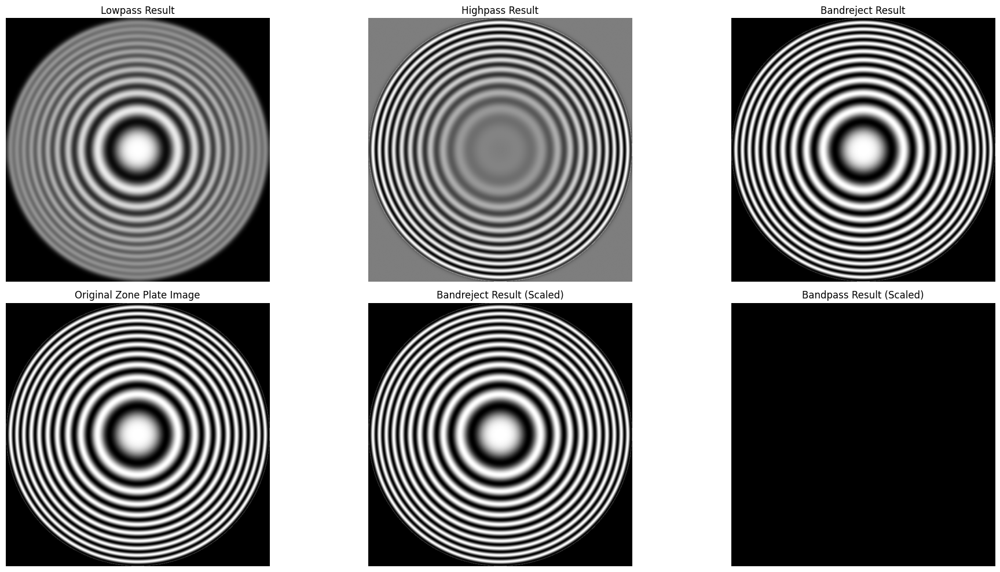

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import convolve
from scipy import fftpack

# Generate Zone Plate image using the provided formula
def generate_zone_plate(size=597, max_radius=8.2, step=0.0275):
    x, y = np.meshgrid(np.arange(-max_radius, max_radius, step), np.arange(-max_radius, max_radius, step))
    z = 0.5 * (1 + np.cos(x**2 + y**2))  # Zone plate equation
    z[np.sqrt(x**2 + y**2) > max_radius] = 0  # Set the outer region to 0 (black region)
    return z

# Generate the Zone Plate image
zone_plate_image = generate_zone_plate()

# 1. Low-pass filtering using a Gaussian filter (blurring)
lowpass_image = cv2.GaussianBlur(zone_plate_image, (21, 21), 5)

# 2. High-pass filtering using the complement of the low-pass kernel (high-pass)
# The high-pass filter is defined as hp(x, y) = δ(x, y) - lp(x, y)
highpass_image = zone_plate_image - lowpass_image

# 3. Bandreject filtering using lp1(x, y) and hp2(x, y)
# Here we will use a simple approach by adding low-pass and high-pass components.
# We can take different low-pass (lp1) and high-pass (hp2) for this purpose.
lp1_image = cv2.GaussianBlur(zone_plate_image, (21, 21), 3)  # First low-pass component
hp2_image = zone_plate_image - lp1_image  # High-pass component

bandreject_image = lp1_image + hp2_image

# 4. Bandpass filtering using the formula bp(x, y) = δ(x, y) - br(x, y)
bandpass_image = zone_plate_image - bandreject_image

# 5. Intensities scaling for better visualization
bandpass_image_scaled = cv2.normalize(bandpass_image, None, 0, 255, cv2.NORM_MINMAX)
bandreject_image_scaled = cv2.normalize(bandreject_image, None, 0, 255, cv2.NORM_MINMAX)

# Create the figure with subplots to display the images
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Display each result as in the figure you provided
axes[0, 0].imshow(lowpass_image, cmap='gray')
axes[0, 0].set_title('Lowpass Result')
axes[0, 0].axis('off')

axes[0, 1].imshow(highpass_image, cmap='gray')
axes[0, 1].set_title('Highpass Result')
axes[0, 1].axis('off')

axes[0, 2].imshow(bandreject_image, cmap='gray')
axes[0, 2].set_title('Bandreject Result')
axes[0, 2].axis('off')

axes[1, 0].imshow(zone_plate_image, cmap='gray')
axes[1, 0].set_title('Original Zone Plate Image')
axes[1, 0].axis('off')

axes[1, 1].imshow(bandreject_image_scaled, cmap='gray')
axes[1, 1].set_title('Bandreject Result (Scaled)')
axes[1, 1].axis('off')

axes[1, 2].imshow(bandpass_image_scaled, cmap='gray')
axes[1, 2].set_title('Bandpass Result (Scaled)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


<ipython-input-84-560244a06d70>:48: RuntimeWarning: invalid value encountered in divide
  g_s = 255 * (g_m / np.max(g_m))  # Scale to the range [0, 255]


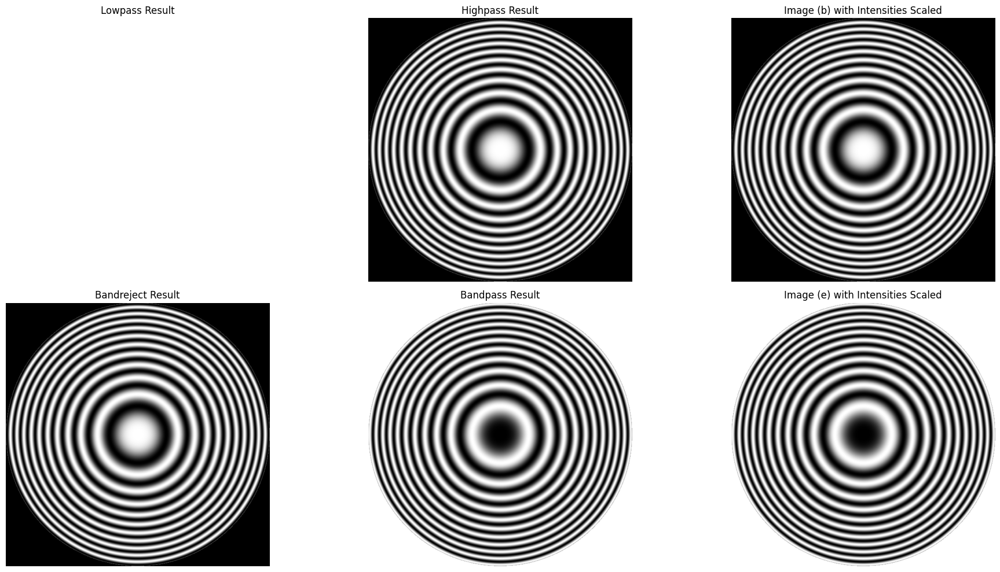

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy import fftpack

# Generate Zone Plate image using the provided formula
def generate_zone_plate(size=597, max_radius=8.2, step=0.0275):
    x, y = np.meshgrid(np.arange(-max_radius, max_radius, step), np.arange(-max_radius, max_radius, step))
    z = 0.5 * (1 + np.cos(x**2 + y**2))  # Zone plate equation
    z[np.sqrt(x**2 + y**2) > max_radius] = 0  # Set the outer region to 0 (black region)
    return z

# Generate the Zone Plate image
zone_plate_image = generate_zone_plate()

# Perform Fourier Transform on the image
f = fftpack.fft2(zone_plate_image)
fshift = fftpack.fftshift(f)  # Shift zero-frequency components to the center

# Create a mask for low-pass filtering (circular mask)
rows, cols = zone_plate_image.shape
crow, ccol = rows // 2, cols // 2
radius = 30
mask = np.ones((rows, cols), dtype=np.float32)

# Create a circular low-pass mask (set central region to 1, others to 0)
x, y = np.fft.fftfreq(cols), np.fft.fftfreq(rows)
xv, yv = np.meshgrid(x, y)
distance = np.sqrt((xv - 0)**2 + (yv - 0)**2)
mask[distance < radius] = 0  # Zero out high frequencies

# Apply the low-pass filter mask
fshift_lowpass = fshift * mask
lowpass_freq_image = np.abs(fftpack.ifft2(np.fft.ifftshift(fshift_lowpass)))

# High-pass filter: subtract low-pass from original image
highpass_freq_image = zone_plate_image - lowpass_freq_image

# Band-pass filter: keep mid-range frequencies by subtracting high-pass from low-pass
bandpass_image = lowpass_freq_image - highpass_freq_image

# Band-reject filter: combine low-pass and high-pass filters
bandreject_image = lowpass_freq_image + highpass_freq_image

# Intensity scaling for better visualization (scaling to range 0-255)
def scale_image(image):
    g_m = image - np.min(image)  # Subtract min to make the minimum value 0
    g_s = 255 * (g_m / np.max(g_m))  # Scale to the range [0, 255]
    return g_s

# Scale the filtered images
lowpass_scaled = scale_image(lowpass_freq_image)
highpass_scaled = scale_image(highpass_freq_image)
bandpass_scaled = scale_image(bandpass_image)
bandreject_scaled = scale_image(bandreject_image)

# Create the figure with subplots to display the images
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Display each result as in the figure you provided
axes[0, 0].imshow(lowpass_scaled, cmap='gray')
axes[0, 0].set_title('Lowpass Result')
axes[0, 0].axis('off')

axes[0, 1].imshow(highpass_scaled, cmap='gray')
axes[0, 1].set_title('Highpass Result')
axes[0, 1].axis('off')

axes[0, 2].imshow(highpass_scaled, cmap='gray')
axes[0, 2].set_title('Image (b) with Intensities Scaled')
axes[0, 2].axis('off')

axes[1, 0].imshow(bandreject_scaled, cmap='gray')
axes[1, 0].set_title('Bandreject Result')
axes[1, 0].axis('off')

axes[1, 1].imshow(bandpass_scaled, cmap='gray')
axes[1, 1].set_title('Bandpass Result')
axes[1, 1].axis('off')

axes[1, 2].imshow(bandpass_scaled, cmap='gray')
axes[1, 2].set_title('Image (e) with Intensities Scaled')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


#Combining Spatial Method


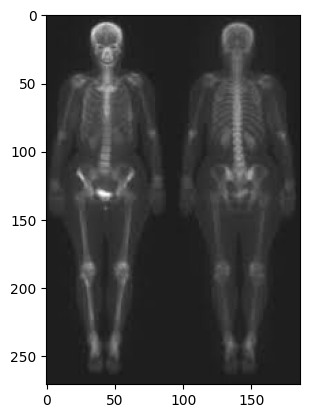

In [9]:
import cv2
import matplotlib.pyplot as plt
import math
import numpy as np


# Read the image
img = cv2.imread(xray_img)

# converting to gray scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display the images
plt.imshow(img, cmap = 'gray')
plt.show()

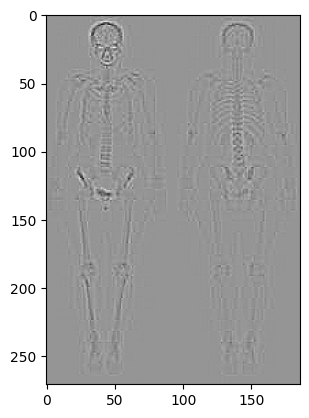

In [10]:
#laplacian of main image
laplacian = cv2.Laplacian(gray,cv2.CV_64F)

# Display the images
plt.imshow(laplacian, cmap = 'gray')
plt.show()

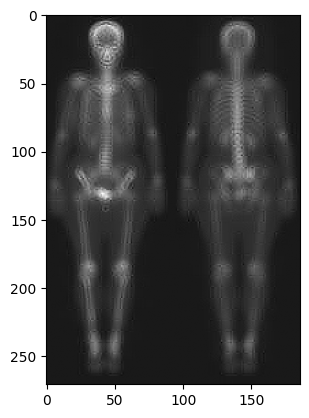

In [11]:
#image sharpening by adding original image and laplacian image
sharpened_img = gray + laplacian

# Display the images
plt.imshow(sharpened_img, cmap = 'gray')
plt.show()

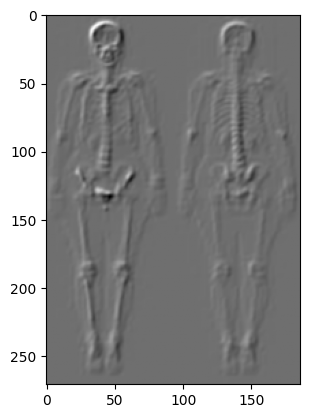

In [24]:
#sobel gradient of original image

sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=5)  # x
sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=5)  # y

sobel_img = sobelx + sobely

# Display the images
plt.imshow(sobel_img, cmap = 'gray')
plt.show()

In [25]:
sobelx.shape

(271, 186)

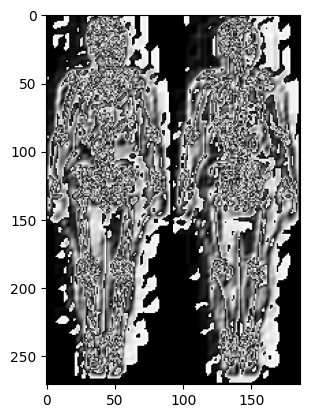

In [28]:
#sobel image smoothed with a 5X5 averaging filter


# Obtain number of rows and columns
# of the image
m, n = sobel_img.shape

# Develop Averaging filter(5, 5) mask
mask = np.ones([5, 5], dtype = int)
mask = mask / 25

# Convolve the 5X5 mask over the image
smoothed_sobel = np.zeros([m, n])

for i in range(1, m-1):
	for j in range(1, n-1):
		temp = sobel_img[i-1, j-1]*mask[0, 0]+sobel_img[i-1, j]*mask[0, 1]+sobel_img[i-1, j + 1]*mask[0, 2]+sobel_img[i, j-1]*mask[1, 0]+ sobel_img[i, j]*mask[1, 1]+sobel_img[i, j + 1]*mask[1, 2]+sobel_img[i + 1, j-1]*mask[2, 0]+sobel_img[i + 1, j]*mask[2, 1]+sobel_img[i + 1, j + 1]*mask[2, 2]

		smoothed_sobel[i, j]= temp

smoothed_sobel = smoothed_sobel.astype(np.uint8)


# Display the images
plt.imshow(smoothed_sobel, cmap = 'gray')
plt.show()

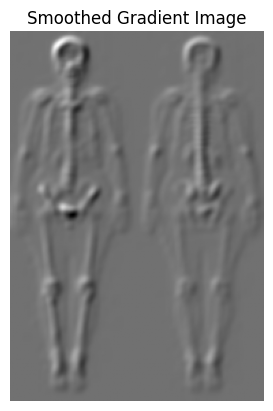

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'gray' is the grayscale image
# Compute Sobel gradients
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)  # Sobel in x direction
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)  # Sobel in y direction

# Combine the Sobel gradients
sobel_img = sobelx + sobely

# Apply a box filter (5x5 kernel) to smooth the gradient image
smoothed_sobel_img = cv2.boxFilter(sobel_img, -1, (5, 5))

# Display the smoothed gradient image
plt.imshow(smoothed_sobel_img, cmap='gray')
plt.title("Smoothed Gradient Image")
plt.axis('off')
plt.show()


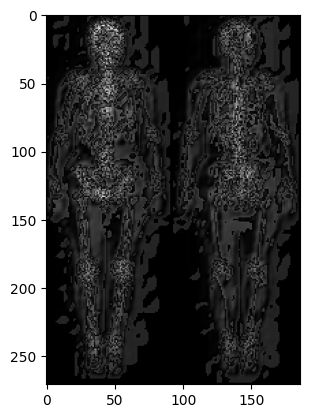

In [29]:
#multiplying sharpened laplacian and smoothed sobel gradient

mask = sharpened_img * smoothed_sobel

# Display the images
plt.imshow(mask, cmap = 'gray')
plt.show()

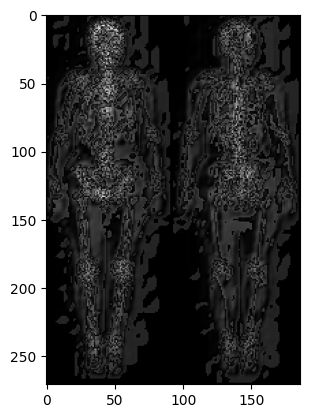

In [30]:
#multiplying sharpened laplacian and smoothed sobel gradient

mask2 = sharpened_img * smoothed_sobel_img

# Display the images
plt.imshow(mask, cmap = 'gray')
plt.show()

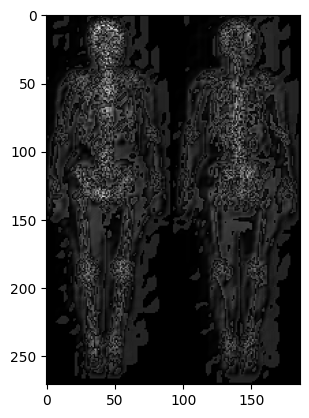

In [31]:
# more sharpened image by summing original image and mask

sharpened_img2 = gray + mask

# Display the images
plt.imshow(sharpened_img2, cmap = 'gray')
plt.show()

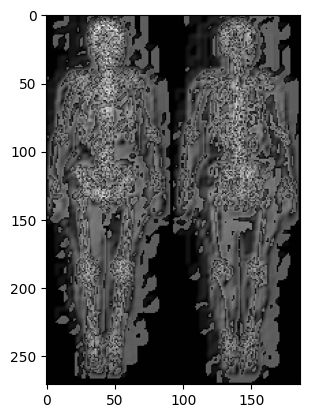

In [32]:
#applying power law for enhancement
gamma = 0.5

# Apply gamma correction.
gamma_corrected = np.array(1*(sharpened_img2) ** gamma, dtype = 'uint8')

plt.imshow(gamma_corrected, cmap='gray')
plt.show()